## Import All Libraries

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.metrics import classification_report , confusion_matrix , accuracy_score , auc
from sklearn.model_selection import train_test_split

import cv2
#from google.colab.patches import cv2_imshow
from PIL import Image
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import Input, Dense,Conv2D , MaxPooling2D, Flatten,BatchNormalization,Dropout
from tensorflow.keras.preprocessing import image_dataset_from_directory
import tensorflow_hub as hub

## Tomato Disease Labels

In [ ]:
labels = {'powdery_mildew': 0,
'healthy':1,
'Tomato_mosaic_virus':2,
'Tomato_Yellow_Leaf_Curl_Virus':3,
          'Target_Spot':4,
          'Spider_mites Two-spotted_spider_mite':5,
          'Septoria_leaf_spot':6,
          'Leaf_Mold':7,
          'Late_blight':8,
          'Early_blight':9,
          'Bacterial_spot':10
 }

## Train Image Data Preprocessing

In [ ]:
train_folder_path = "C:/Users/admin/Downloads/tom/train"
image_data = []
image_label = []
for i in os.listdir(train_folder_path):
    #print(i)
    path = "C:/Users/admin/Downloads/tom/train"
    path_class = os.path.join("C:/Users/admin/Downloads/tom/train",i)
    #print(path_class)
    for j in os.listdir(path_class):
        image = Image.open(path_class+"/"+j)
        image = image.resize((128,128))
        image = image.convert("RGB")
        image = np.array(image)
        image_data.append(image)
        image_label.append(labels[i])

In [ ]:
train_folder_path ="C:/Users/admin/Downloads/DATASET TOMATO/train"

In [ ]:
print(len(image_data))
print(len(image_label))

25848
25848


In [ ]:
image_data[0].shape

(128, 128, 3)

In [ ]:
x_train = np.array(image_data)
y_train = np.array(image_label)
print(x_train.shape)
print(y_train.shape)

(25848, 128, 128, 3)
(25848,)


## Test Image Data Preprocessing

In [ ]:
test_folder_path = "C:/Users/admin/Downloads/tom/valid"
image_data1 = []
image_label1 = []
for i in os.listdir(test_folder_path):
    #print(i)
    path_class = os.path.join("C:/Users/admin/Downloads/tom/valid",i)
    #print(path_class)
    for j in os.listdir(path_class):
        image = Image.open(path_class+"/"+j)
        image = image.resize((128,128))
        image = image.convert("RGB")
        image = np.array(image)
        image_data1.append(image)
        image_label1.append(labels[i])

In [ ]:
print(len(image_data1))
print(len(image_label1))

6683
6683


In [ ]:
x_test = np.array(image_data1)
y_test = np.array(image_label1)
print(x_test.shape)
print(y_test.shape)

(6683, 128, 128, 3)
(6683,)


In [ ]:
class_labels = ['powdery_mildew',
'healthy',
'Tomato_mosaic_virus',
'Tomato_Yellow_Leaf_Curl_Virus',
          'Target_Spot',
          'Spider_mites Two-spotted_spider_mite',
          'Septoria_leaf_spot',
          'Leaf_Mold',
          'Late_blight',
          'Early_blight',
          'Bacterial_spot'

]


In [ ]:
print (len(class_labels))

11


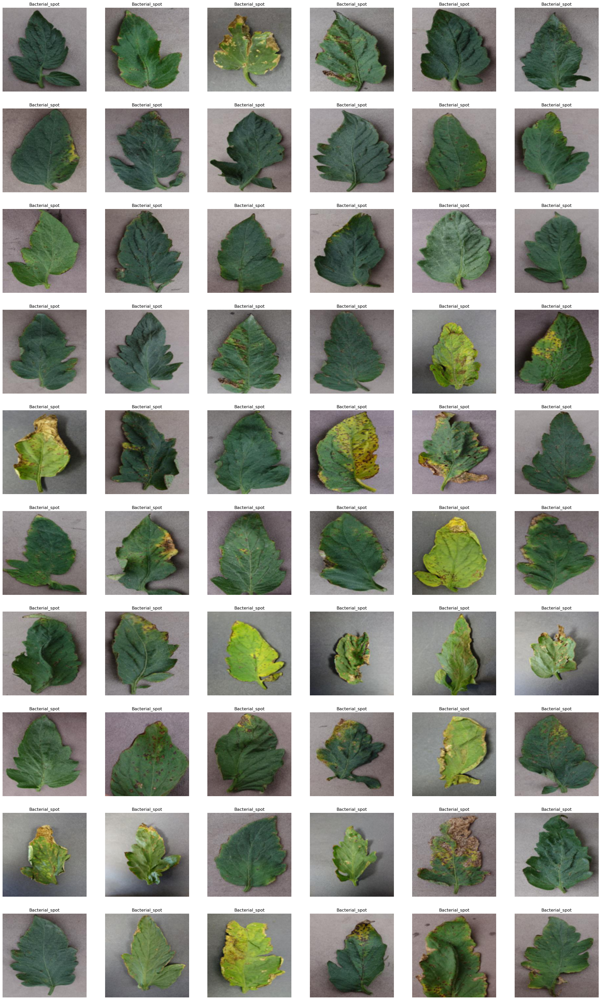

In [ ]:
# Your code for plotting
import matplotlib.pyplot as plt

plt.figure(figsize=(30, 50))
for i in range(60):
    plt.subplot(10, 6, i+1)
    plt.imshow(x_train[i])
    plt.title(class_labels[y_train[i]])
    plt.axis("off")

plt.show()

# Train Image data

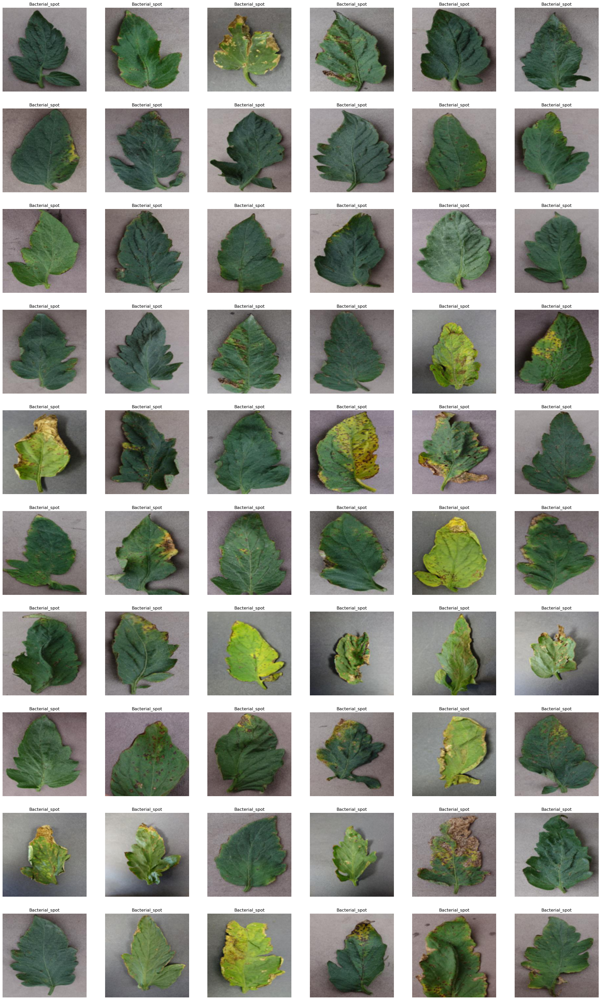

In [ ]:
plt.figure(figsize=(30,50))
for i in range(60):
    plt.subplot(10,6,i+1)
    plt.imshow(x_train[i])
    plt.title(class_labels[y_train[i]])
    plt.axis("off")

# Resizing and Scaling

In [ ]:
resizing_and_rescaling = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.Resizing(224,224),
    tf.keras.layers.experimental.preprocessing.Rescaling(1.0/255)
])

# Data Augmentation

In [ ]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomContrast(0.3),
    tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal_and_vertical'),
    tf.keras.layers.experimental.preprocessing.RandomZoom(0.3),
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.2)
])

# CNN Model

In [ ]:
IMAGE_SIZE=224
CHANNELS=3
BATCH_SIZE=256


input_shape=(BATCH_SIZE , IMAGE_SIZE, IMAGE_SIZE, CHANNELS)

model= tf.keras.models.Sequential([
  resizing_and_rescaling,
  data_augmentation,
  # Convolution layer 1
  tf.keras.layers.Conv2D(filters=120, kernel_size=(3,3), strides=(1,1),padding='same',activation='relu',input_shape=input_shape),
  tf.keras.layers.MaxPool2D(pool_size=(2,2)),
  # Convolution layer 2
  tf.keras.layers.Conv2D(filters=100, kernel_size=(3,3),strides=(1,1),padding='same',activation='relu'),
  tf.keras.layers.MaxPool2D(pool_size=(2,2)),
  # Convolution layer 3
  tf.keras.layers.Conv2D(filters=80, kernel_size=(3,3),strides=(1,1),padding='same',activation='relu'),
  tf.keras.layers.MaxPool2D(pool_size=(2,2)),
  # Convolution layer 4
  tf.keras.layers.Conv2D(filters=60, kernel_size=(3,3),strides=(1,1),padding='same',activation='relu'),
  tf.keras.layers.MaxPool2D(pool_size=(2,2)),

  # Flatten Layers
  tf.keras.layers.Flatten(),

  # Dense layers
  tf.keras.layers.Dense(units=1000,activation='relu'),
  tf.keras.layers.Dropout(0.4),
  tf.keras.layers.Dense(units=500,activation='relu'),
  tf.keras.layers.Dropout(0.3),
  tf.keras.layers.Dense(units=100,activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(units=11,activation='softmax')

])

model.build(input_shape=input_shape)

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (64, 224, 224, 3)         0         
                                                                 
 sequential_1 (Sequential)   (64, 224, 224, 3)         0         
                                                                 
 conv2d (Conv2D)             (64, 224, 224, 120)       3360      
                                                                 
 max_pooling2d (MaxPooling2  (64, 112, 112, 120)       0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (64, 112, 112, 100)       108100    
                                                                 
 max_pooling2d_1 (MaxPoolin  (64, 56, 56, 100)         0         
 g2D)                                                 

In [ ]:
model.compile(optimizer="adam",
             loss="sparse_categorical_crossentropy",
             metrics=["accuracy"])

history = model.fit(x_train,y_train ,batch_size=256 ,epochs=30,
                verbose=1,
                validation_data=(x_test,y_test))

Epoch 1/30
101/101 [==============================] - 566s 6s/step - loss: 1.3303 - accuracy: 0.5340 - val_loss: 0.8404 - val_accuracy: 0.7066
Epoch 2/30
101/101 [==============================] - 562s 6s/step - loss: 1.1039 - accuracy: 0.6182 - val_loss: 0.7257 - val_accuracy: 0.7453
Epoch 3/30
101/101 [==============================] - 561s 6s/step - loss: 0.9722 - accuracy: 0.6627 - val_loss: 0.7432 - val_accuracy: 0.7374
Epoch 4/30
101/101 [==============================] - 560s 6s/step - loss: 0.8792 - accuracy: 0.6958 - val_loss: 0.5890 - val_accuracy: 0.7938
Epoch 5/30
101/101 [==============================] - 558s 6s/step - loss: 0.7704 - accuracy: 0.7347 - val_loss: 0.5686 - val_accuracy: 0.8010
Epoch 6/30
101/101 [==============================] - 563s 6s/step - loss: 0.7199 - accuracy: 0.7497 - val_loss: 0.4478 - val_accuracy: 0.8438
Epoch 7/30
101/101 [==============================] - 560s 6s/step - loss: 0.6566 - accuracy: 0.7717 - val_loss: 0.4702 - val_accuracy: 0.8365

Accuracy

In [ ]:
loss,acc = model.evaluate(x_train,y_train)
print("Loss on Train data:",loss)
print("Accuracy on Train data:",acc)

loss1,acc1 = model.evaluate(x_test,y_test)

print("Loss on Test data:",loss1)
print("Accuracy on Test data:",acc1)

808/808 [==============================] - 169s 209ms/step - loss: 0.1875 - accuracy: 0.9314
Loss on Train data: 0.18745116889476776
Accuracy on Train data: 0.9314066767692566
209/209 [==============================] - 43s 208ms/step - loss: 0.2317 - accuracy: 0.9195
Loss on Test data: 0.231683149933815
Accuracy on Test data: 0.9194972515106201


In [ ]:
acc = history.history["accuracy"]
val_acc = history.history["val_accuracy"]

loss = history.history["loss"]
val_loss = history.history["val_loss"]

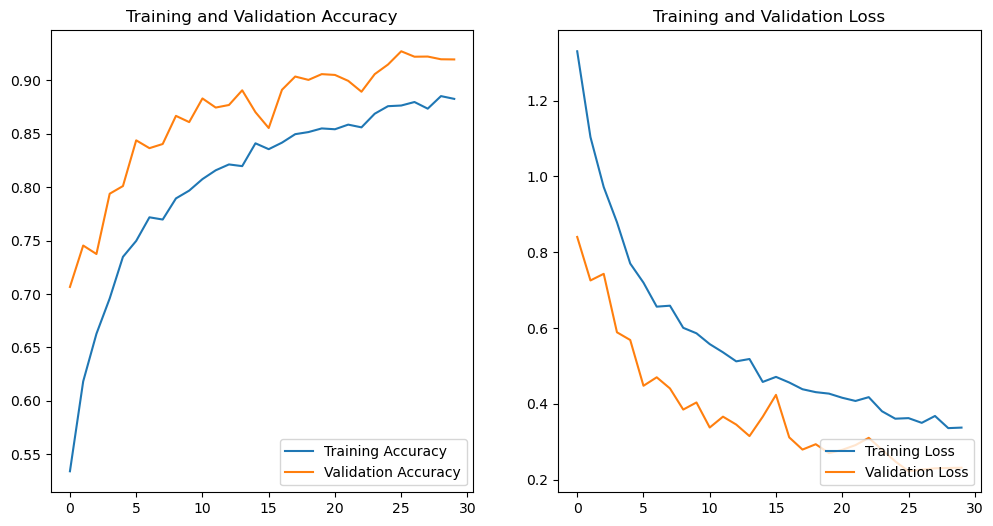

In [ ]:
EPOCHS=30
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS),acc, label="Training Accuracy")
plt.plot(range(EPOCHS),val_acc, label="Validation Accuracy")
plt.legend(loc="lower right")
plt.title("Training and Validation Accuracy")

#plt.figure(figsize=(6,6))
plt.subplot(1,2,2)
plt.plot(range(EPOCHS),loss, label="Training Loss")
plt.plot(range(EPOCHS),val_loss, label="Validation Loss")
plt.legend(loc="lower right")
plt.title("Training and Validation Loss")
plt.show()

In [ ]:
y_pred = model.predict(x_test)
y_pred_label = [np.argmax(i) for i in y_pred]
y_pred_label[:5]

209/209 [==============================] - 44s 208ms/step


[10, 10, 10, 10, 10]

In [ ]:

len(y_pred_label)

6683

# Image Prediction

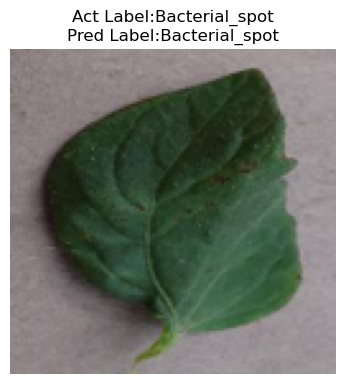

In [ ]:
plt.figure(figsize=(30,60))
j=1
for i in range(0,6000,10001):
    plt.subplot(12,6,j)
    plt.imshow(x_test[i])
    plt.title(f"Act Label:{class_labels[y_test[i]]}\nPred Label:{class_labels[y_pred_label[i]]}")
    plt.axis("off")
    j+=1

In [ ]:
'''import tensorflow as tf

# Define and compile your CNN model
model = tf.keras.Sequential([
    # ... your CNN layers here ...
])

# Compile the model (specify optimizer, loss, metrics)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model with your data
# model.fit(x_train, y_train, epochs=num_epochs, batch_size=batch_size)

# Save the entire model to a file
model.save("path/to/save/model.h5")'''
import tensorflow as tf

# Define and compile your CNN model
model = tf.keras.Sequential([
    # ... your CNN layers here ...
])

# Assuming x_train and y_train are your training data
# Call the model on a sample input to create the weights
sample_input = x_train[0:1]  # Adjust this based on your actual data
_ = model(sample_input)

# Compile the model (specify optimizer, loss, metrics)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model with your data
# model.fit(x_train, y_train, epochs=num_epochs, batch_size=batch_size)

# Save the entire model to a file
model.save("path/to/save/model.h5")



In [ ]:
print("[INFO] Calculating model accuracy")
scores = model.evaluate(x_test, y_test)
print(f"Test Accuracy:{scores[1]*100}")

[INFO] Calculating model accuracy


TypeError: ignored

In [ ]:
import pickle
print("[INFO] Saving model...")
pickle.dump(model,open('cnn_model.pkl', 'wb'))

[INFO] Saving model...


PermissionError: ignored

In [ ]:
loaded_model = pickle.load(open('cnn_model.pkl', 'rb'))

In [ ]:
loaded_model = pickle.load(open('path\\cnn_model.pkl', 'rb'))

In [ ]:
#Finr Tuning the model
quant_aware_model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
#Create a Quantization Aware Model
!pip install --upgrade tensorflow-model-optimization
import tensorflow_model_optimization as tfmot

In [ ]:
#Quantize only the Dense, MaxPool2D, Conv2D Layers
def apply_quantization(layer):
    if (
        isinstance(layer, layers.Dense)
        or isinstance(layer, layers.MaxPool2D)
        or isinstance(layer, layers.Conv2D)
    ):
        return tfmot.quantization.keras.quantize_annotate_layer(layer)
    return layer

In [ ]:
annotated_model = tf.keras.models.clone_model(
    model,
    clone_function=apply_quantization,
)

quant_aware_model = tfmot.quantization.keras.quantize_apply(annotated_model)
quant_aware_model.summary()